#Lab : Satellite Image Segmentation and Flood Detection using K-Means Clustering

#Importing Libraries

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage import io, transform

#Loading Both image

In [ ]:
imag_path_bf = "/content/drive/MyDrive/Ai Training MetaPi/Week_5/W5_D4_clustering/b_flood.png"
imag_path_af=    "/content/drive/MyDrive/Ai Training MetaPi/Week_5/W5_D4_clustering/a_flood.png"

rgb_image_bf="/content/drive/MyDrive/Ai Training MetaPi/Week_5/W5_D4_clustering/b_flood.png"
rgb_image_af="/content/drive/MyDrive/Ai Training MetaPi/Week_5/W5_D4_clustering/a_flood.png"

image_bf_dis = Image.open(rgb_image_bf)
image_af_dis = Image.open(rgb_image_af)

image_bf = Image.open(imag_path_bf).convert("L") #
image_af = Image.open(imag_path_af).convert("L") #

#Displaying Image

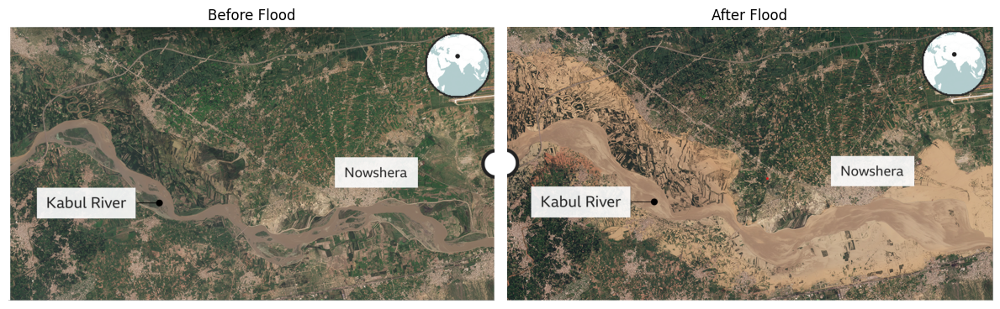

In [ ]:
#plotting
plt.figure(figsize=(12, 4))
plt.subplot(121)
plt.imshow(image_bf_dis)
plt.title('Before Flood')
plt.axis('off')  # Image dimensions
plt.subplot(122)
plt.imshow(image_af_dis)
plt.title('After Flood')
plt.axis('off')
plt.tight_layout()
plt.show()

Pre-Processing Both images

In [ ]:
#Before Flood
image_np_bf = np.array(image_bf)
# Reshape the image to a 1D array for K-means clustering
image_1d_bf = image_np_bf.reshape(-1, 1)

In [ ]:
#After Flood
image_np_af = np.array(image_af)
# Reshape the image to a 1D array for K-means clustering
image_1d_af = image_np_af.reshape(-1, 1)

Visualizing Dimensions

In [ ]:
image_np_bf.shape, image_1d_bf.shape

((890, 1580), (1406200, 1))

In [ ]:
image_np_af.shape, image_1d_af.shape

((888, 1572), (1395936, 1))

#Clustering

*Before Flood*

In [ ]:
#K-means clustering Before Flood
n_bf=3
kmeans_bf = KMeans(n_clusters=n_bf)
cluster_assignments_bf = kmeans_bf.fit_predict(image_1d_bf)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
cluster_assignments_bf.shape

(1406200,)

In [ ]:
# Reshape the cluster assignments back to the image shape
clustered_image_bf = cluster_assignments_bf.reshape(image_np_bf.shape)

In [ ]:
clustered_image_bf.shape

(890, 1580)

After Flood

In [ ]:
#K-means clustering Before Flood
n_af=4
kmeans_af = KMeans(n_clusters=n_af)
cluster_assignments_af = kmeans_af.fit_predict(image_1d_af)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
cluster_assignments_af.shape

(1395936,)

In [ ]:
# Reshape the cluster assignments back to the image shape
clustered_image_af = cluster_assignments_af.reshape(image_np_af.shape)

In [ ]:
clustered_image_af.shape

(888, 1572)

#Showing cluster image

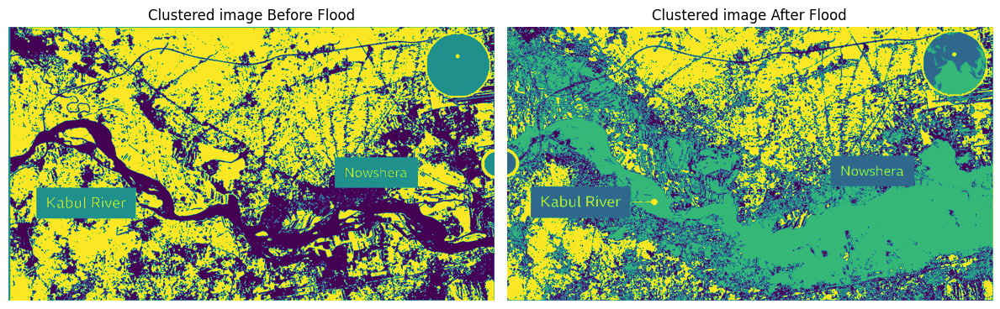

In [ ]:
#plotting
plt.figure(figsize=(12, 4))
plt.subplot(121)
plt.imshow(clustered_image_bf)
plt.title('Clustered image Before Flood')
plt.axis('off')  # Image dimensions
plt.subplot(122)
plt.imshow(clustered_image_af)
plt.title('Clustered image After Flood')
plt.axis('off')
plt.tight_layout()
plt.show()

#Masking

#Before Flooding

In [ ]:
masks_bf = []
for cluster_id_bf in range(n_bf):
 cluster_mask_bf = (cluster_assignments_bf == cluster_id_bf).reshape(image_np_bf.shape)
 masks_bf.append(cluster_mask_bf)

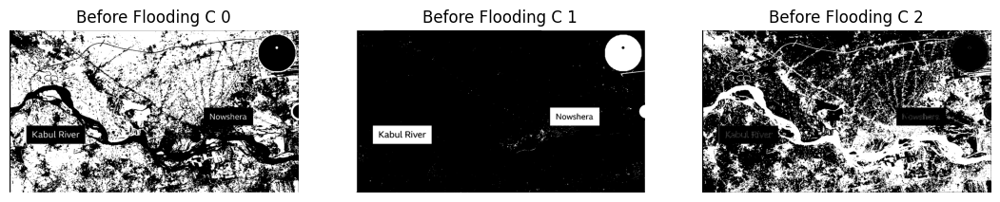

In [ ]:
#plotting
plt.figure(figsize=(18, 12))
for i in range(n_bf):
 plt.subplot(1, n_bf + 1, i + 2)
 plt.imshow(masks_bf[i], cmap='gray')
 plt.title(f'Before Flooding C {i}')
 plt.axis('off')

# Extractin C2 mask before flood

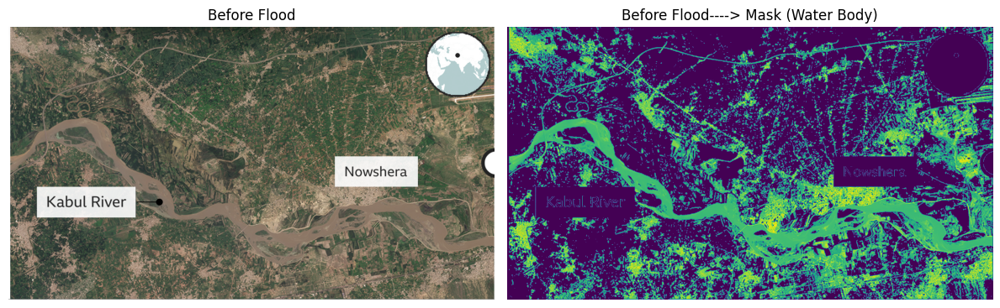

In [ ]:
mask_3rd_bf= image_np_bf*masks_bf[2]
# plt.imshow(mask_3rd_bf,'gray')

#plotting
plt.figure(figsize=(12, 4))
plt.subplot(121)
plt.imshow(image_bf_dis)
plt.title('Before Flood')
plt.axis('off')  # Image dimensions
plt.subplot(122)
plt.imshow(mask_3rd_bf)
plt.title('Before Flood----> Mask (Water Body)')
plt.axis('off')
plt.tight_layout()
plt.show()

#After Flooding

In [ ]:
masks_af = []
for cluster_id_af in range(n_af):
 cluster_mask_af = (cluster_assignments_af == cluster_id_af).reshape(image_np_af.shape)
 masks_af.append(cluster_mask_af)

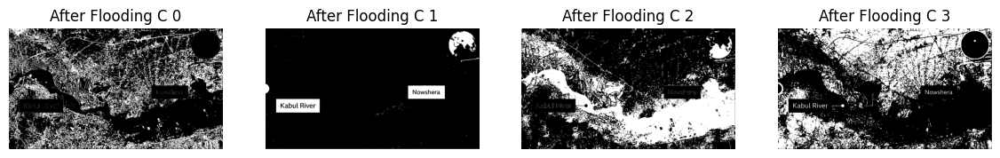

In [ ]:
#plotting
plt.figure(figsize=(18, 12))
for i in range(n_af):
 plt.subplot(1, n_af + 1, i + 2)
 plt.imshow(masks_af[i], cmap='gray')
 plt.title(f'After Flooding C {i}')
 plt.axis('off')

Extractin C3 mask After Flood

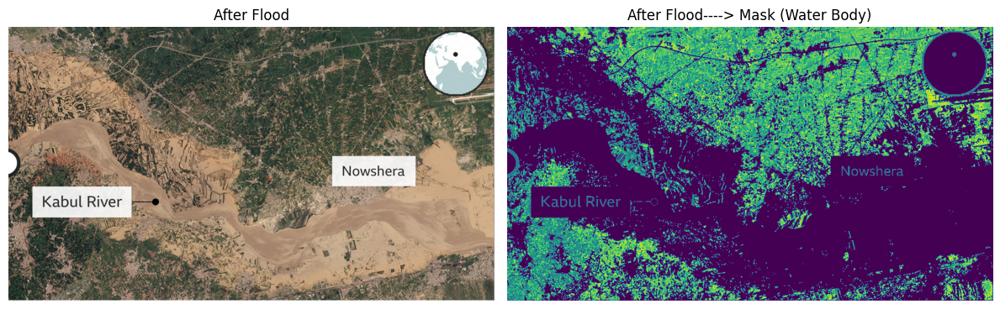

In [ ]:
mask_4th_af= image_np_af*masks_af[3]
# plt.imshow(mask_4th_af,"gray")

#plotting
plt.figure(figsize=(12, 4))
plt.subplot(121)
plt.imshow(image_af_dis)
plt.title('After Flood')
plt.axis('off')  # Image dimensions
plt.subplot(122)
plt.imshow(mask_4th_af)
plt.title('After Flood----> Mask (Water Body)')
plt.axis('off')
plt.tight_layout()
plt.show()

#Visualizing Difference of After Flood and Before Flood

In [ ]:
# updated_mask_3rd_bf=transform.resize(mask_4th_af, mask_3rd_bf.shape)

In [ ]:
updated_mask_3rd_bf = transform.resize(mask_3rd_bf,mask_4th_af.shape)

In [ ]:
Difference =  mask_4th_af - updated_mask_3rd_bf

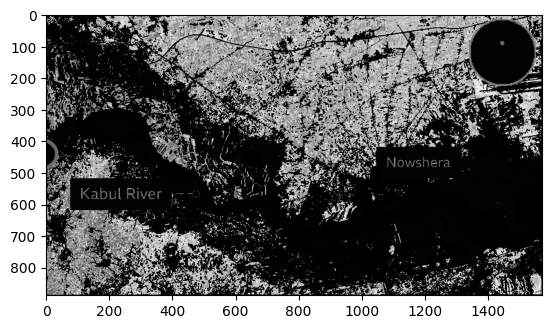

In [ ]:
plt.imshow(Difference,cmap='gray')

#Visulizing the Difference in RGB

**Before Flood**

segmented image


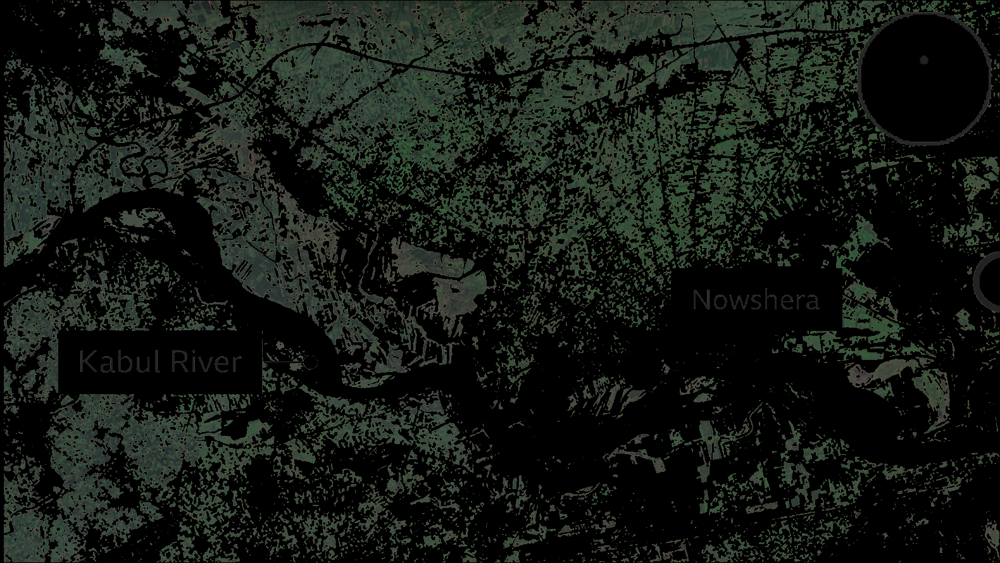

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
RGB_BF= True
def segment_water(image_path, output_path, clusters=4):
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    pixel_values = np.float32(gray.reshape((-1, 1)))

    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixel_values, clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    segmented_image = np.uint8(centers)[labels.flatten()].reshape(gray.shape)
    RGB_BF = cv2.bitwise_and(image, image, mask=(labels.reshape(gray.shape) == np.argmin(centers)).astype(np.uint8))

    cv2.imwrite(output_path, RGB_BF)
    print("segmented image")
    cv2_imshow(RGB_BF)
rgb_out_bf=RGB_BF
segment_water("/content/drive/MyDrive/Ai Training MetaPi/Week_5/W5_D4_clustering/b_flood.png", 'RGB_BF.png')


**After Flood**

segmented image


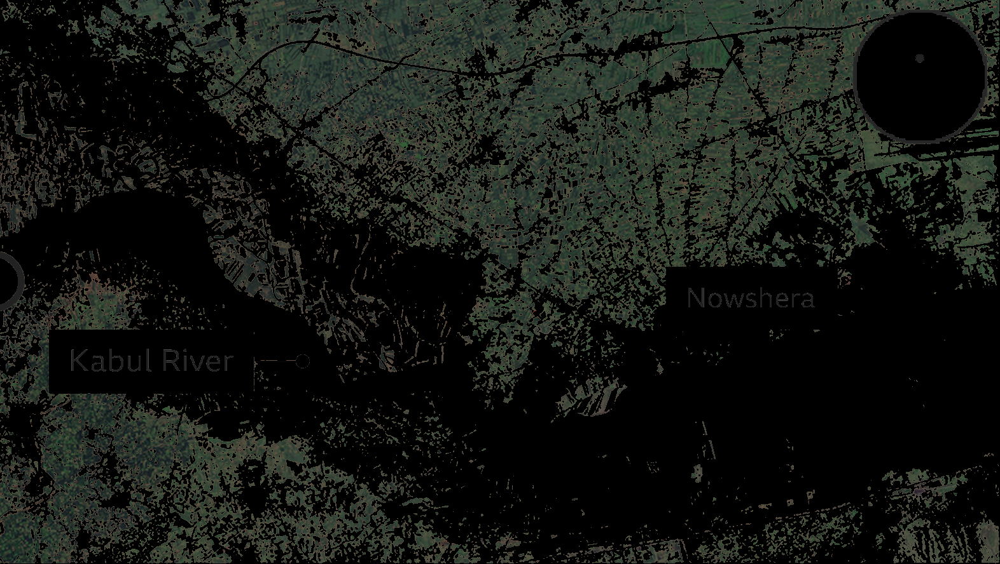

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
def segment_water(image_path, output_path, clusters=4):
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    pixel_values = np.float32(gray.reshape((-1, 1)))

    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixel_values, clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    segmented_image = np.uint8(centers)[labels.flatten()].reshape(gray.shape)
    RGB_Af = cv2.bitwise_and(image, image, mask=(labels.reshape(gray.shape) == np.argmin(centers)).astype(np.uint8))
    # return RGB_Af

    cv2.imwrite(output_path, RGB_Af)
    print("segmented image")
    cv2_imshow(RGB_Af)

segment_water("/content/drive/MyDrive/Ai Training MetaPi/Week_5/W5_D4_clustering/a_flood.png", 'RGB_Af.png')
image_af='RGB_Af.png'

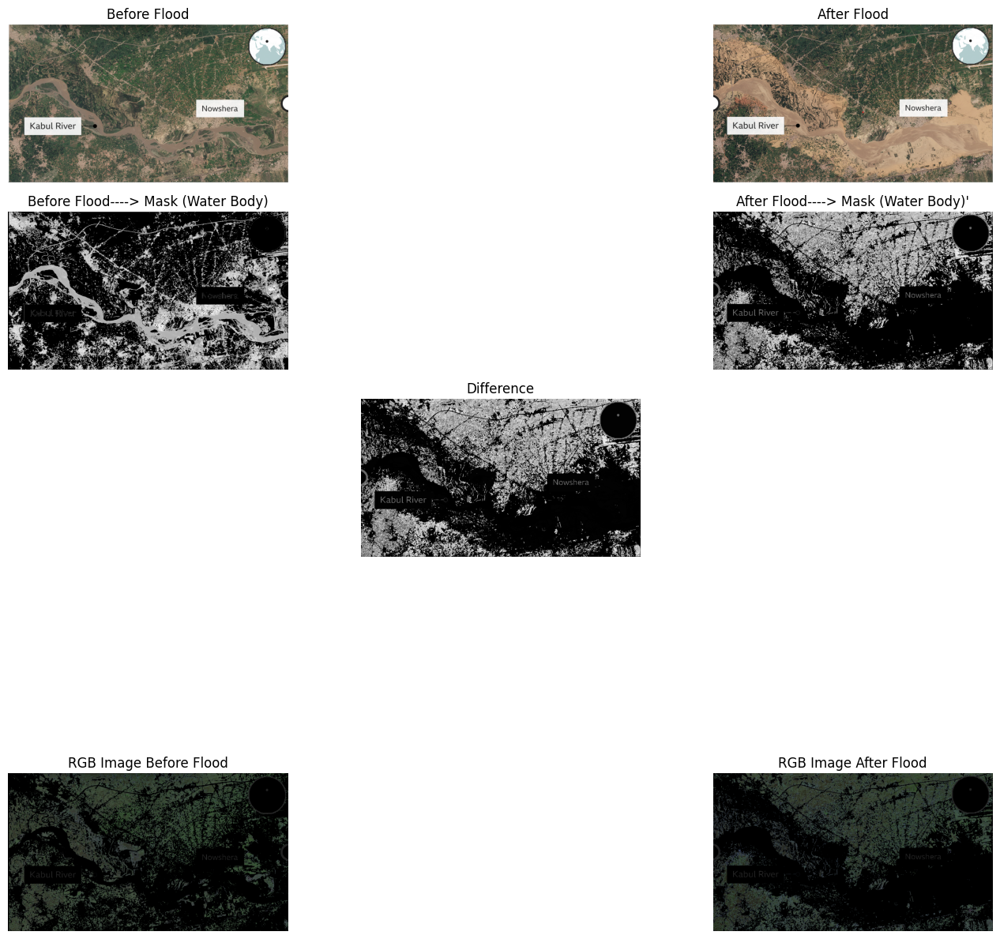

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Images
image1 = image_bf_dis
image2 = image_af_dis
image3 = mask_3rd_bf
image4 = mask_4th_af
image5 = Difference # This image will span two columns in the third row
image6 = ... # This image will span two columns in the fourth row
image7 = cv2.imread('RGB_BF.png')
image8 = cv2.imread('RGB_Af.png')
# Corresponding titles
title1 = 'Before Flood'
title2 = 'After Flood'
title3 = "Before Flood----> Mask (Water Body)"
title4 = "After Flood----> Mask (Water Body)'"
title5 = "Difference"
title6 = ""
title7 = "RGB Image Before Flood"
title8 = "RGB Image After Flood"


# Create a figure
fig = plt.figure(figsize=(18, 12))
gs = gridspec.GridSpec(5, 2)

ax1 = fig.add_subplot(gs[0, 0])
ax1.imshow(image1, "gray")
ax1.set_title(title1)
ax1.axis('off')

ax2 = fig.add_subplot(gs[0, 1])
ax2.imshow(image2, "gray")
ax2.set_title(title2)
ax2.axis('off')

ax3 = fig.add_subplot(gs[1, 0])
ax3.imshow(image3, "gray")
ax3.set_title(title3)
ax3.axis('off')

ax4 = fig.add_subplot(gs[1, 1])
ax4.imshow(image4, "gray")
ax4.set_title(title4)
ax4.axis('off')

# Image 5 spans two columns
ax5 = fig.add_subplot(gs[2, :])
ax5.imshow(image5, "gray")
ax5.set_title(title5)
ax5.axis('off')

# # Image 6 spans two columns
# ax6 = fig.add_subplot(gs[3, :])
# ax6.imshow(image6, "gray")
# ax6.set_title(title6)
# ax6.axis('off')

# Image 7
ax7 = fig.add_subplot(gs[4, 0])
ax7.imshow(image7)
ax7.set_title(title7)
ax7.axis('off')


# Image 8
ax8 = fig.add_subplot(gs[4, 1])
ax8.imshow(image8, "gray")
ax8.set_title(title8)
ax8.axis('off')

plt.tight_layout()
plt.show()



---



---



---


#**Report**

---



---



---



#Satellite Image Segmentation and Flood Detection

>>- Objective

The goal of this project was to perform satellite image segmentation to detect flooded areas before and after an event and visualize the differences.

>>-  Data Loading and Display

Loaded satellite images of the same area before and after a flood event.
Displayed the "Before Flood" and "After Flood" images for visual comparison.
>>-  Pre-Processing

Converted the images to grayscale for further processing.
Reshaped the grayscale images to 1D arrays for K-means clustering.
>> **K-Means Clustering**

>>- Before Flood:

Applied K-means clustering with 3 clusters to the "Before Flood" image.
Reshaped the cluster assignments to the original image shape.
Displayed the clustered image before the flood.
>>- After Flood:

Applied K-means clustering with 4 clusters to the "After Flood" image.
Reshaped the cluster assignments to the original image shape.
Displayed the clustered image after the flood.
>> **Masking**

>>- Before Flood

Created masks for each cluster in the "Before Flood" image.
Displayed individual cluster masks for visual inspection.
>>- After Flood

Created masks for each cluster in the "After Flood" image.
Displayed individual cluster masks for visual inspection.
>>- Mask Difference Visualization

Generated a difference mask between the "After Flood" water mask and the "Before Flood" water mask.
Visualized the difference mask to highlight areas affected by the flood.
>> RGB Visualization

>>- Before Flood

Utilized OpenCV and K-means clustering to segment the "Before Flood" image into distinct regions.
Generated an RGB representation of the clustered "Before Flood" image.
Displayed the segmented RGB image before the flood.
>>- After Flood

Utilized OpenCV and K-means clustering to segment the "After Flood" image into distinct regions.
Generated an RGB representation of the clustered "After Flood" image.
Displayed the segmented RGB image after the flood.
>>- Visualization

Plotted a grid of images including the original "Before Flood" and "After Flood" images, water masks, difference mask, and RGB segmented images.
Provided titles for each image to label and explain the content.
Used gridspec to arrange images in a structured manner.

>>**Conclusion:**

In this project, we successfully performed satellite image segmentation to detect flooded areas before and after an event. We utilized K-means clustering to separate different components within the images, created masks to isolate specific regions of interest, visualized the differences in water masks, and generated RGB representations of the segmented images. The outcome of the project allows for better understanding and analysis of the flood's impact on the landscape.